# Song Vocal Extraction

## Imports

In [24]:
import os
import time

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import librosa
import librosa.display
from IPython.display import Audio
import stempeg
import soundfile as sf

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

## Grabbing Data

In [25]:
path = "./data/"
song_names = os.listdir(path)
print(len(song_names))

150


## Understanding Data Format

In [26]:
def getSongStems(path, new_sr):
    x, sr = stempeg.read_stems(path, stem_id=[0, 4])
    x = (x[:, :, 0] + x[:, :, 1]) / 2.0
    x = librosa.resample(x, orig_sr=sr, target_sr=new_sr)
    return x, new_sr

In [27]:
file_path = path + song_names[1]
x, sr = getSongStems(file_path, 8192)

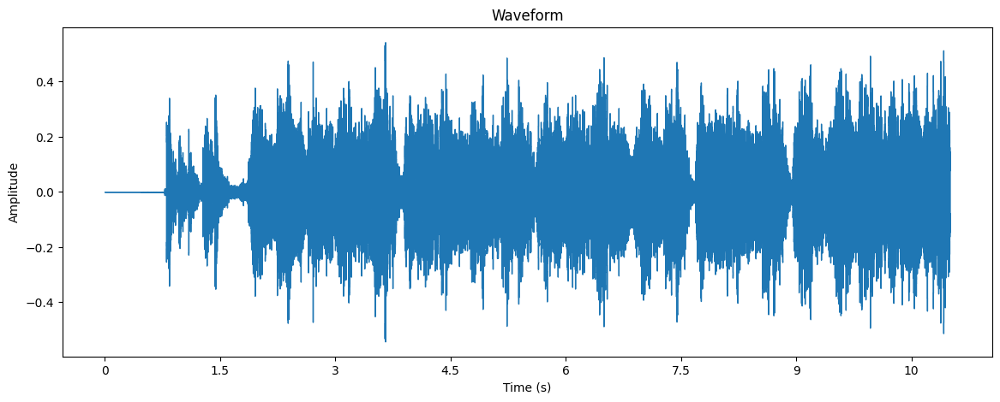

In [28]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x[0, : sr * 11], sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

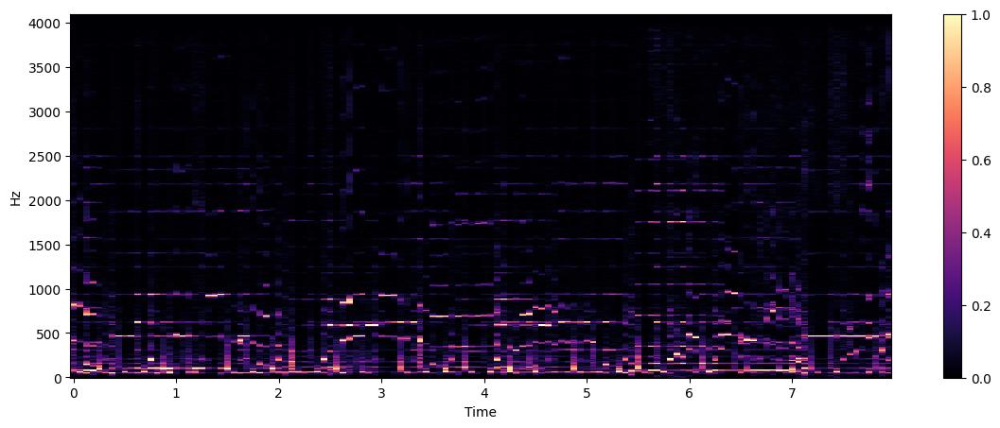

In [29]:
plt.figure(figsize=(14, 5))
db_spec = abs(librosa.stft(x[0, sr*24:sr * 36], n_fft=1024, win_length = 1024, hop_length = 768))[:-1, :-1]
scaler = MinMaxScaler()
db_spec = scaler.fit_transform(db_spec)
librosa.display.specshow(db_spec, sr=sr, x_axis = "time", y_axis = "hz")
plt.colorbar()

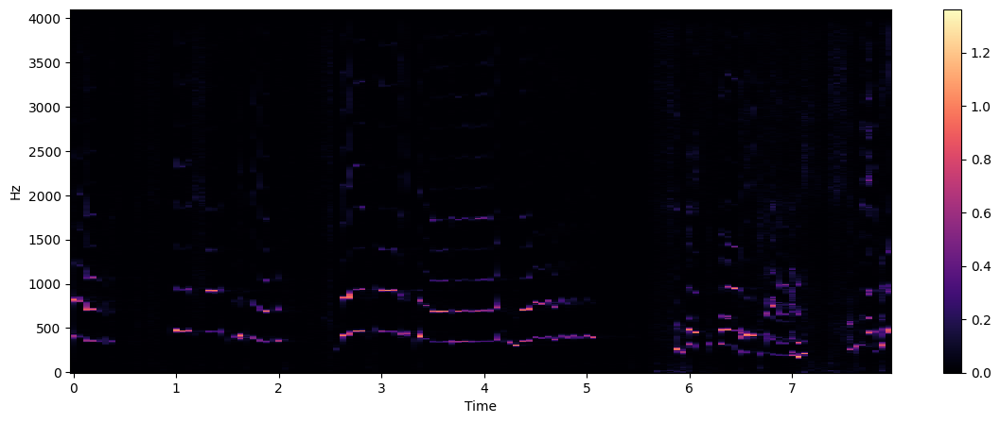

In [30]:
plt.figure(figsize=(14, 5))
db_spec_v = abs(librosa.stft(x[1, sr*24:sr * 36], n_fft=1024, win_length = 1024, hop_length = 768))[:-1, :-1]
db_spec_v = scaler.transform(db_spec_v)
librosa.display.specshow(db_spec_v, sr=sr, x_axis = "time", y_axis = "hz")
plt.colorbar()

In [31]:
db_spec.shape

(512, 128)

### Playing Full Song

In [32]:
Audio(x[0], rate=sr)

### Playing Isolated Audio

In [33]:
Audio(x[1], rate=sr)

## Data Preparation

### Split Data Into 12 Second Clips

In [34]:
def get_clips(song_name, path, output_dir, new_sr = 8192, segment_duration = 12):
    x, sr = getSongStems(path + song_name, new_sr)
    num_segments = int(len(x[0]) / (segment_duration * sr))
    
    if not os.path.exists(output_dir + "mixtures/"):
        os.makedirs(output_dir + "mixtures/")

    if not os.path.exists(output_dir + "vocals/"):
        os.makedirs(output_dir + "vocals/")
        
    for i in range(num_segments):
        start_sample = i * segment_duration * sr
        end_sample = (i + 1) * segment_duration * sr
        mixture_segment = x[0, start_sample:end_sample]
        vocal_segment = x[1, start_sample:end_sample]
        mixture_output_path = os.path.join(output_dir + "mixtures/", f"{song_name}_segment_{i}.wav")
        vocal_output_path = os.path.join(output_dir + "vocals/", f"{song_name}_segment_{i}.wav")
        sf.write(mixture_output_path, mixture_segment, sr)
        sf.write(vocal_output_path, vocal_segment, sr)

#### Train Test Split Before Creating 12 Second Segments

In [186]:
train_songs, test_songs = train_test_split(song_names, test_size=0.2, random_state=42)

train_output_dir = "./segmented_data/train/"
for song in train_songs:
    get_clips(song, path, train_output_dir)

test_output_dir = "./segmented_data/test/"
for song in test_songs:
    get_clips(song, path, test_output_dir)

### Generate Spectrograms for each Song Segment

In [35]:
def getSpectrograms(path, sr = 8192):
    mixtures = []
    vocals = []
    scalers = []

    song_names = os.listdir(path + 'mixtures')
    for song_name in song_names:
        m, _ = librosa.load(path + 'mixtures/' + song_name, sr = sr)
        v, _ = librosa.load(path + 'vocals/' + song_name, sr = sr)
        M = abs(librosa.stft(m, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1])
        V = abs(librosa.stft(v, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1])
        scaler = MinMaxScaler()
        M = scaler.fit_transform(M)
        V = scaler.transform(V)
        mixtures.append([M])
        vocals.append([V])
        scalers.append(scaler)

    return torch.tensor(mixtures), torch.tensor(vocals), scalers

In [36]:
train_mix_specs, train_voc_specs, train_scalers = getSpectrograms("./segmented_data/train/")
test_mix_specs, test_voc_specs, test_scalers = getSpectrograms("./segmented_data/test/")

C:\Users\user\AppData\Local\Temp\ipykernel_9980\1995937917.py:19: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:281.)
  return torch.tensor(mixtures), torch.tensor(vocals), scalers


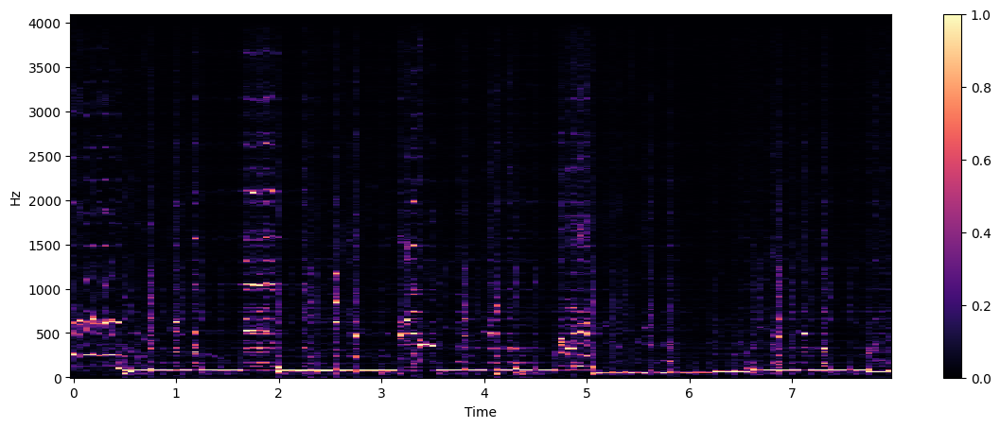

In [37]:
plt.figure(figsize = (14, 5))
librosa.display.specshow(train_mix_specs[200, 0, :, :].numpy(), sr = 8192, x_axis = "time", y_axis = "hz")
plt.colorbar()

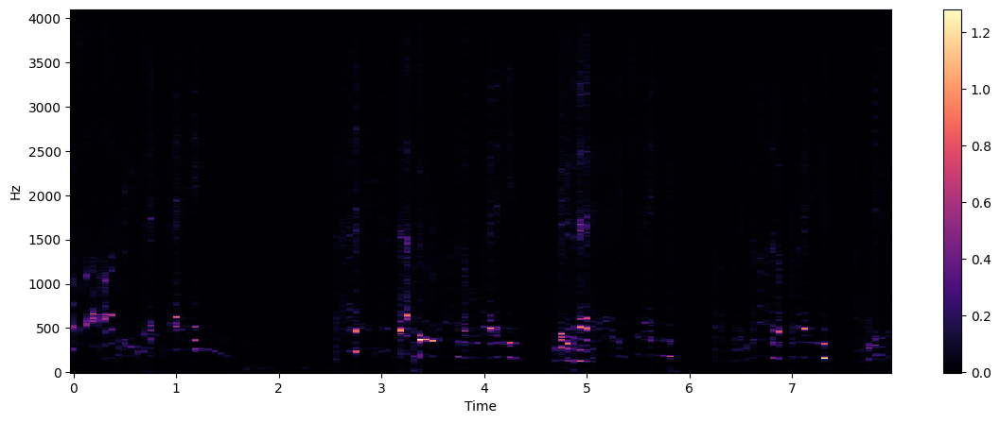

In [38]:
plt.figure(figsize = (14, 5))
librosa.display.specshow(train_voc_specs[200, 0, :, :].numpy(), sr = 8192, x_axis = "time", y_axis = "hz")
plt.colorbar()

In [39]:
train_mix_specs.shape

torch.Size([2329, 1, 512, 128])

### Creating PyTorch Database

In [40]:
class SongDataset(Dataset):
    def __init__(self, mixture, vocals):
        self.mixture = mixture
        self.vocals = vocals

    def __len__(self):
        return len(self.mixture)

    def __getitem__(self, idx):
        return self.mixture[idx, :, :], self.vocals[idx, :, :]

In [41]:
train_dataset = SongDataset(train_mix_specs, train_voc_specs)
test_dataset = SongDataset(test_mix_specs, test_voc_specs)

### Creating PyTorch DataLoaders

In [42]:
train_dl = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_dl = DataLoader(test_dataset, batch_size=16, shuffle=True)

## Defining Basic U-NET

In [43]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 3, stride = 1):
        super(ConvBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, padding=kernel_size // 2),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride = stride, padding=kernel_size // 2),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(negative_slope=0.2, inplace=True),
            nn.Dropout2d(0.2)
        )

    def forward(self, x):
        return self.block(x)

class ConvEncoder(ConvBlock):
    def __init__(self, in_channels, kernel_size = 5, stride = 2):
        super(ConvEncoder, self).__init__(in_channels, in_channels * 2, kernel_size, stride)

class ConvDecoder(ConvBlock):
    def __init__(self, in_channels, kernel_size = 5):
        super(ConvDecoder, self).__init__(in_channels, in_channels // 2, kernel_size)

class Upsampler(nn.Module):
    def __init__(self, in_channel):
        super(Upsampler, self).__init__()
        self.conv_t = nn.ConvTranspose2d(in_channel, in_channel // 2, kernel_size=5, stride=2, padding=2, output_padding=1)

    def forward(self, x):
        return self.conv_t(x)

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()    

        # Encoders
        self.encoder1 = ConvBlock(1, 16)
        self.encoder2 = ConvEncoder(16)
        self.encoder3 = ConvEncoder(32)
        self.encoder4 = ConvEncoder(64)
        self.encoder5 = ConvEncoder(128)
        
        # Bottleneck
        self.bottleneck = ConvEncoder(256)
        
        # Transpose Convolutions
        self.up6 = Upsampler(512)
        self.up5 = Upsampler(256)
        self.up4 = Upsampler(128)
        self.up3 = Upsampler(64)
        self.up2 = Upsampler(32)

        # Decoders
        self.decoder5 = ConvDecoder(512)
        self.decoder4 = ConvDecoder(256)
        self.decoder3 = ConvDecoder(128)
        self.decoder2 = ConvDecoder(64)
        self.decoder1 = ConvDecoder(32)
        
        self.mask = nn.Conv2d(16, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)
        enc5 = self.encoder5(enc4)
        
        # Bottleneck
        bottleneck = self.bottleneck(enc5)
        
        # Decoder
        dec_in_5 = torch.cat((enc5, self.up6(bottleneck)), dim=1)
        dec5 = self.decoder5(dec_in_5)
        dec_in_4 = torch.cat((enc4, self.up5(dec5)), dim=1)
        dec4 = self.decoder4(dec_in_4)
        dec_in_3 = torch.cat((enc3, self.up4(dec4)), dim=1)
        dec3 = self.decoder3(dec_in_3)
        dec_in_2 = torch.cat((enc2, self.up3(dec3)), dim=1)
        dec2 = self.decoder2(dec_in_2)
        dec_in_1 = torch.cat((enc1, self.up2(dec2)), dim=1)
        dec1 = self.decoder1(dec_in_1)
        
        # Output
        mask = self.mask(dec1)
        mask = self.sigmoid(mask)
        
        return mask

## Defining Training Loop

In [44]:
def save_checkpoint(model, optimizer, epoch, loss, path):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, path)
    print(f'Checkpoint saved at epoch {epoch}')

In [45]:
def train_model(model, train_loader, test_loader, num_epochs):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.train()
    criterion = nn.L1Loss()
    optimizer = optim.Adam(model.parameters(), lr=1e-2)
    scheduler = StepLR(optimizer, step_size=10, gamma=0.45)

    checkpoint_path = "./checkpoints/"

    if not os.path.exists(checkpoint_path):
        os.makedirs(checkpoint_path)
    
    for epoch in range(num_epochs):
        print(f'Epoch [{epoch+1}/{num_epochs}]')
        epoch_start_time = time.time()
        running_loss = 0.0
        
        for i, data in enumerate(train_loader, 0):
            inputs, targets = data[0].to(device), data[1].to(device)
            if (i % 50 == 0):
                print(f'\tBatch progress [{i * inputs.shape[0]}/{len(train_loader) * inputs.shape[0]}]')
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs * inputs, targets)
            loss.backward()
            optimizer.step()

            if (i == 0 and epoch % 10 == 0):
                plt.figure(figsize=(12, 10))
                plt.subplot(4, 1, 1)
                plt.title('Input Spectrogram')
                librosa.display.specshow(inputs[0, 0, :, :].cpu().numpy(), sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()
            
                plt.subplot(4, 1, 2)
                plt.title('Target Spectrogram (Vocals)')
                librosa.display.specshow(targets[0, 0, :, :].cpu().numpy(), sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()

                plt.subplot(4, 1, 3)
                plt.title('Mask')
                librosa.display.specshow(outputs[0, 0, :, :].cpu().detach().numpy(), sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()
            
                plt.subplot(4, 1, 4)
                plt.title('Output Spectrogram (Predicted Vocals)')
                librosa.display.specshow((outputs[0, 0, :, :] * inputs[0, 0, :, :]).cpu().detach().numpy() , sr=8192, x_axis='time', y_axis='log', cmap='magma')
                plt.colorbar()
            
                plt.tight_layout()
                plt.show()
                
            running_loss += loss.item()

        scheduler.step()
        epoch_end_time = time.time()
        epoch_duration = epoch_end_time - epoch_start_time
        print(f'Loss: {running_loss/len(train_loader):.4f}, runtime: {epoch_duration}')
        evaluate_model(model, test_loader)
        save_checkpoint(model, optimizer, epoch + 1, loss.item(), checkpoint_path + f"epoch_{epoch + 1}.pt")
        
    print('Finished Training')

In [46]:
def evaluate_model(model, test_loader):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    criterion = nn.L1Loss()
    test_loss = 0.0
    
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
    
    print(f'Test Loss: {test_loss/len(test_loader):.4f}')
    model.train()

## Training Model

In [47]:
unet = UNet()

Epoch [1/60]
	Batch progress [0/2336]


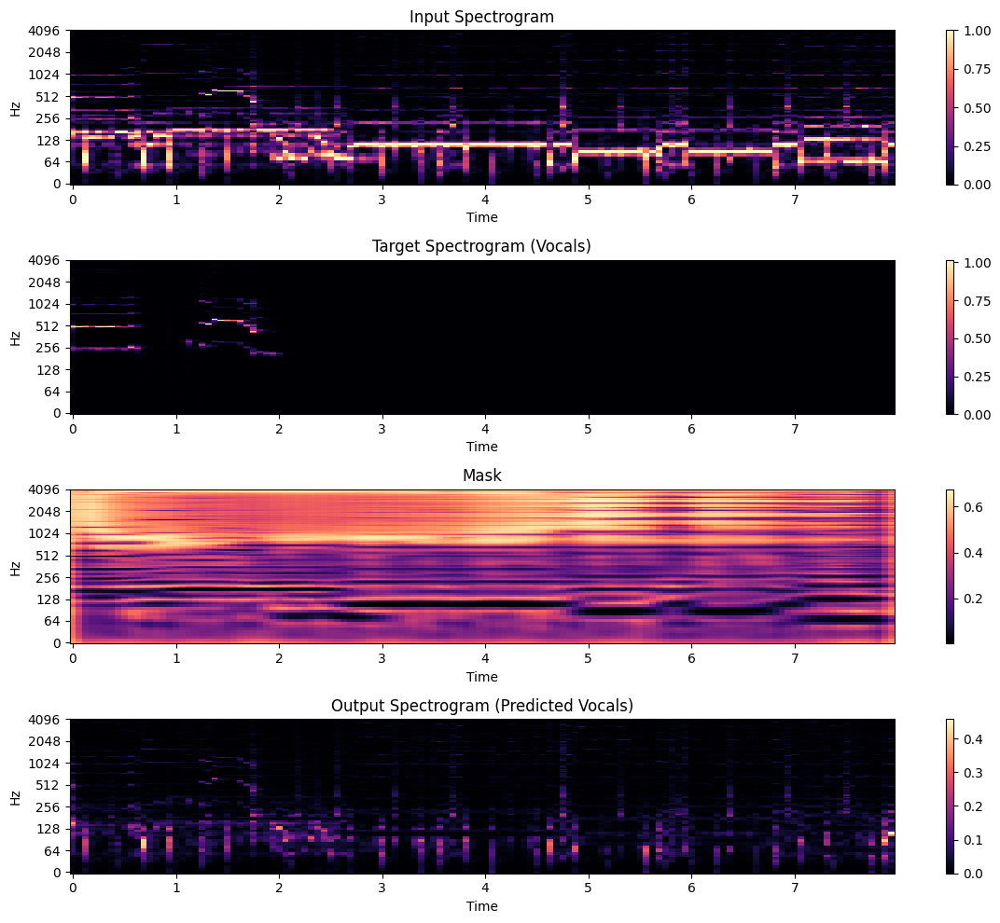

	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0124, runtime: 80.01543664932251
Test Loss: 0.1215
Checkpoint saved at epoch 1
Epoch [2/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0119, runtime: 79.04917812347412
Test Loss: 0.1297
Checkpoint saved at epoch 2
Epoch [3/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0114, runtime: 79.17968082427979
Test Loss: 0.0977
Checkpoint saved at epoch 3
Epoch [4/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0113, runtime: 79.28683066368103
Test Loss: 0.0703
Checkpoint saved at epoch 4
Epoch [5/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0112, runtime: 79.18925094604492
Test Loss: 0.1065
Checkpoint saved at epoch 5
Epoch [6/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0111, runtime: 79.54938650131226
Test

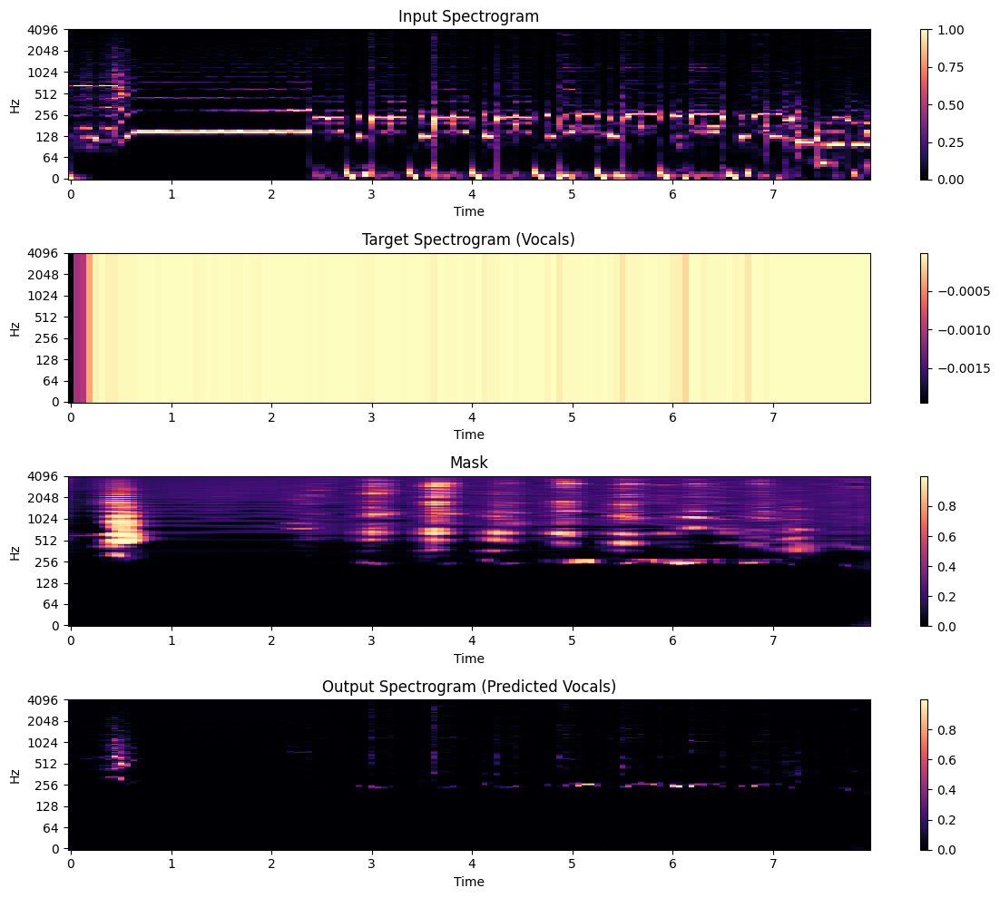

	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0107, runtime: 80.15102481842041
Test Loss: 0.1412
Checkpoint saved at epoch 11
Epoch [12/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0106, runtime: 79.02299523353577
Test Loss: 0.0840
Checkpoint saved at epoch 12
Epoch [13/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0106, runtime: 79.15639162063599
Test Loss: 0.0576
Checkpoint saved at epoch 13
Epoch [14/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0105, runtime: 79.25546979904175
Test Loss: 0.0728
Checkpoint saved at epoch 14
Epoch [15/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0105, runtime: 79.13052535057068
Test Loss: 0.1561
Checkpoint saved at epoch 15
Epoch [16/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0104, runtime: 79.058906316

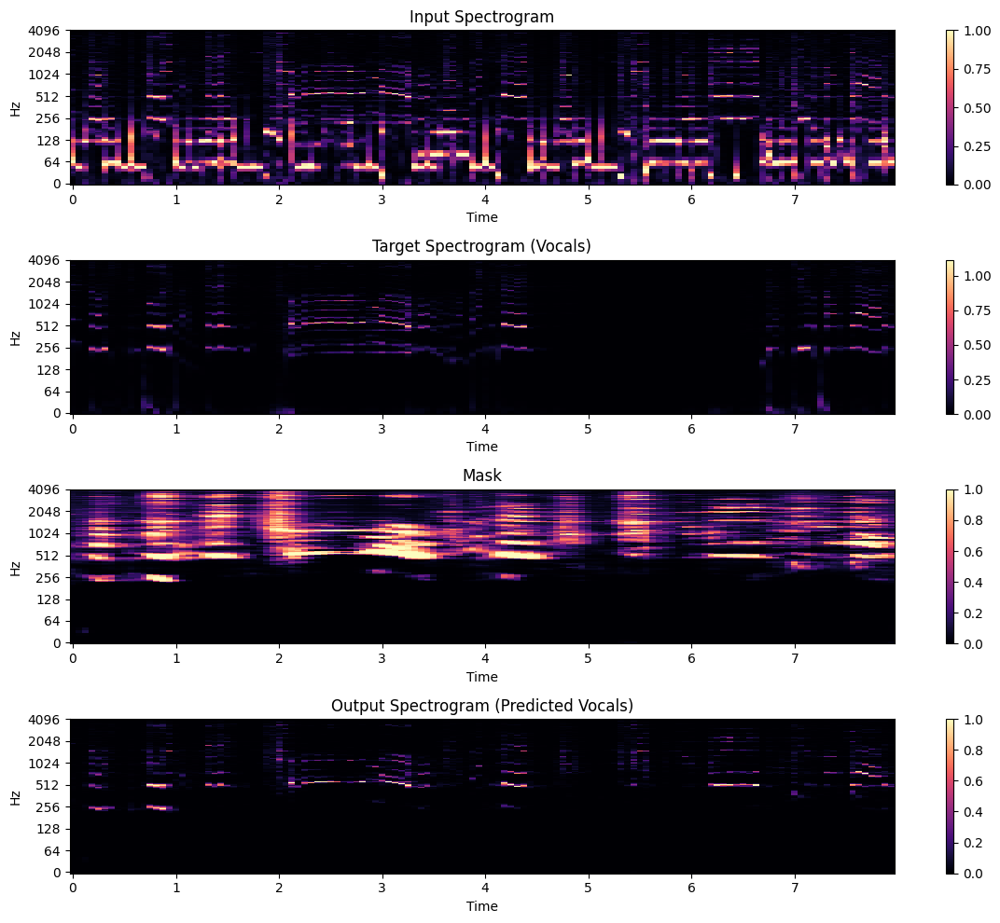

	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0100, runtime: 79.99689054489136
Test Loss: 0.1786
Checkpoint saved at epoch 21
Epoch [22/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0100, runtime: 79.05078196525574
Test Loss: 0.1274
Checkpoint saved at epoch 22
Epoch [23/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0100, runtime: 79.11837673187256
Test Loss: 0.1254
Checkpoint saved at epoch 23
Epoch [24/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0099, runtime: 79.06796455383301
Test Loss: 0.1245
Checkpoint saved at epoch 24
Epoch [25/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0098, runtime: 79.04041910171509
Test Loss: 0.0831
Checkpoint saved at epoch 25
Epoch [26/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0097, runtime: 79.064344882

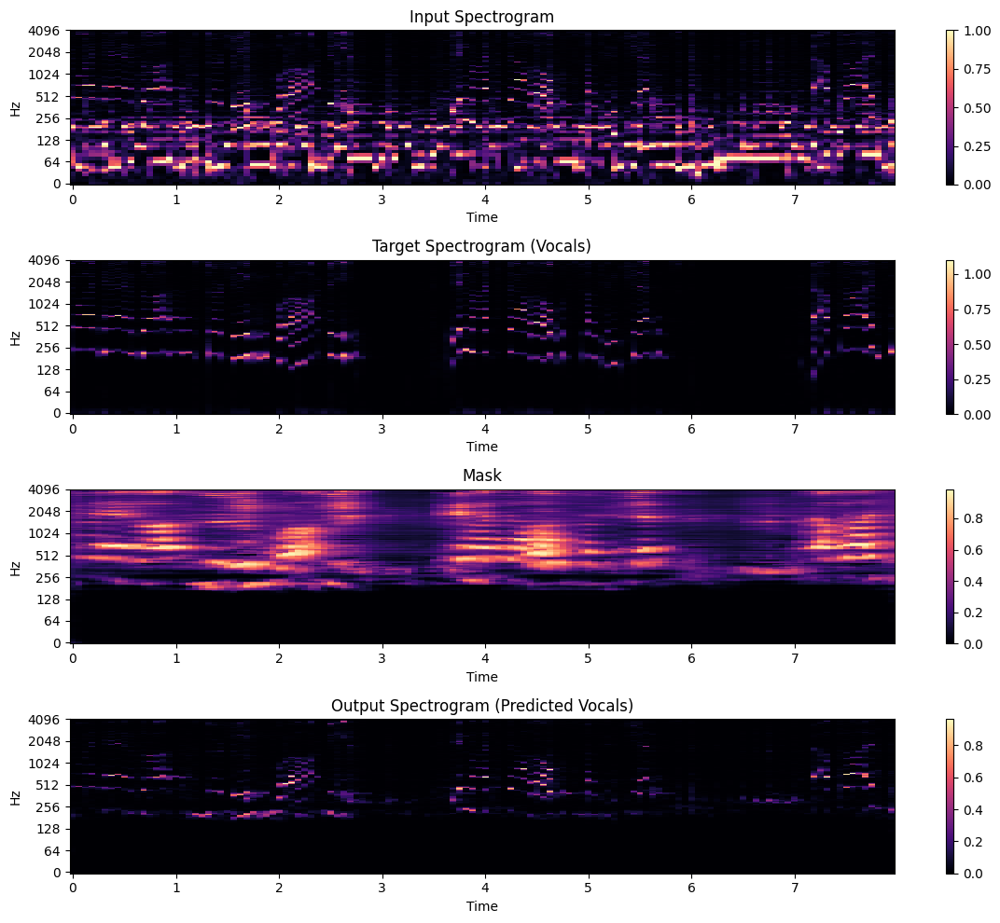

	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0095, runtime: 79.96379494667053
Test Loss: 0.2546
Checkpoint saved at epoch 31
Epoch [32/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0094, runtime: 79.04559516906738
Test Loss: 0.1922
Checkpoint saved at epoch 32
Epoch [33/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0094, runtime: 79.04557299613953
Test Loss: 0.1127
Checkpoint saved at epoch 33
Epoch [34/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0094, runtime: 79.07499289512634
Test Loss: 0.1359
Checkpoint saved at epoch 34
Epoch [35/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0093, runtime: 79.07593512535095
Test Loss: 0.1793
Checkpoint saved at epoch 35
Epoch [36/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0093, runtime: 79.009158849

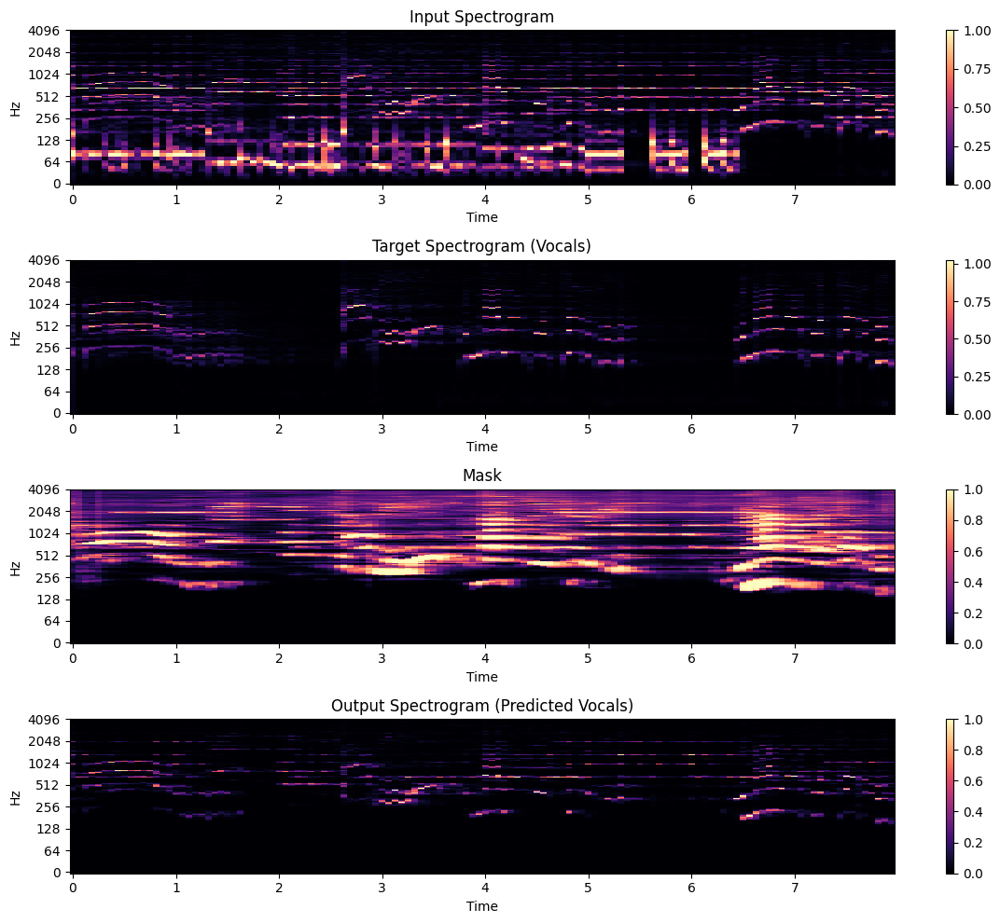

	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0092, runtime: 79.9118423461914
Test Loss: 0.1390
Checkpoint saved at epoch 41
Epoch [42/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0092, runtime: 79.03677034378052
Test Loss: 0.1433
Checkpoint saved at epoch 42
Epoch [43/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0091, runtime: 79.05406212806702
Test Loss: 0.2057
Checkpoint saved at epoch 43
Epoch [44/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0092, runtime: 79.11669087409973
Test Loss: 0.1406
Checkpoint saved at epoch 44
Epoch [45/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0091, runtime: 79.05004477500916
Test Loss: 0.1619
Checkpoint saved at epoch 45
Epoch [46/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0091, runtime: 79.0144600868

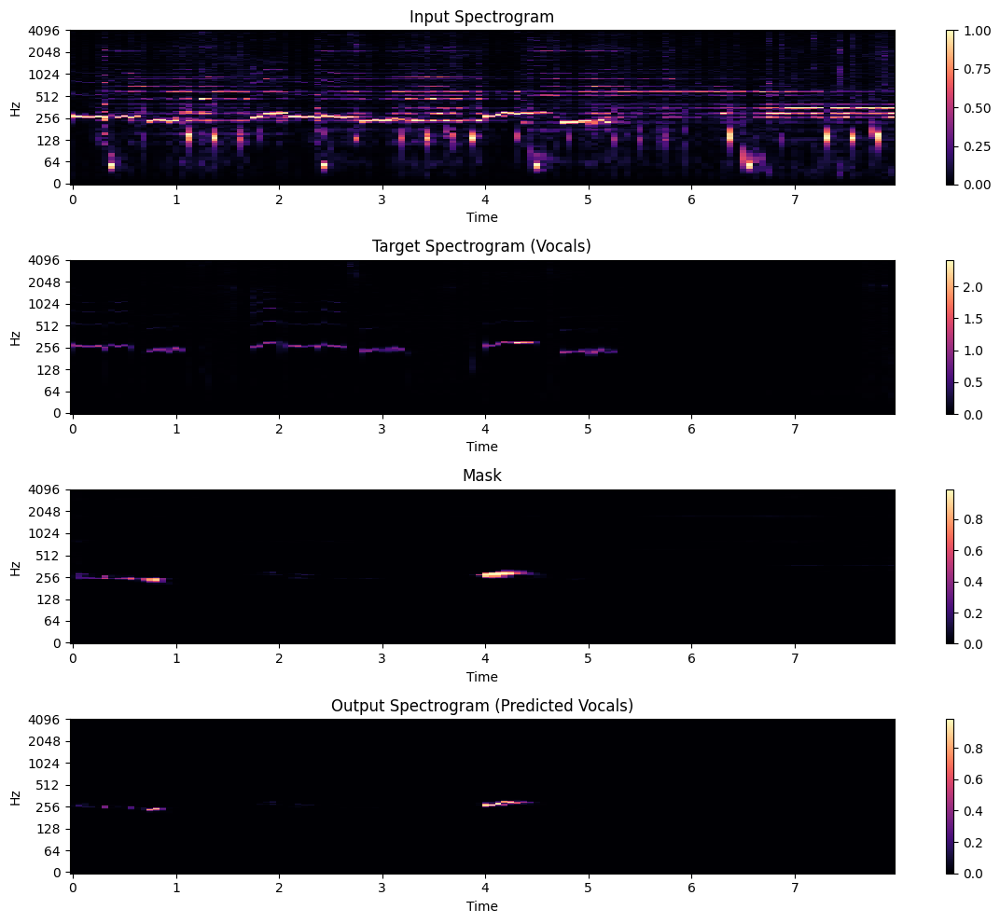

	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0091, runtime: 80.17035698890686
Test Loss: 0.1518
Checkpoint saved at epoch 51
Epoch [52/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0091, runtime: 79.10364556312561
Test Loss: 0.1798
Checkpoint saved at epoch 52
Epoch [53/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0091, runtime: 79.06964802742004
Test Loss: 0.1573
Checkpoint saved at epoch 53
Epoch [54/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0090, runtime: 79.05217289924622
Test Loss: 0.1707
Checkpoint saved at epoch 54
Epoch [55/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0090, runtime: 79.10289406776428
Test Loss: 0.1666
Checkpoint saved at epoch 55
Epoch [56/60]
	Batch progress [0/2336]
	Batch progress [800/2336]
	Batch progress [1600/2336]
Loss: 0.0091, runtime: 79.047438383

In [196]:
train_model(unet, train_dl, test_dl, num_epochs=60)

### Choosing Best Model

In [55]:
def load_checkpoint(model, path):
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint['model_state_dict'])
    return model

unet = load_checkpoint(unet, './checkpoints/epoch_25.pt')

## Evaluating Performance

In [56]:
def get_test_data(idx):
    song_name = os.listdir('./segmented_data/test/mixtures')[idx]
    m, _ = librosa.load('./segmented_data/test/mixtures/' + song_name, sr = 8192)
    v, _ = librosa.load('./segmented_data/test/vocals/' + song_name, sr = 8192)
    M = librosa.stft(m, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1]
    V = librosa.stft(v, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1]
    scaler = MinMaxScaler()
    M_scaled = scaler.fit_transform(np.abs(M))
    V_scaled = scaler.transform(np.abs(V))
    return M_scaled, V_scaled, M, V, scaler

In [60]:
def test_result(model, idx, display=True):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.eval()
    
    # Select a single instance from the batch
    input_instance = test_mix_specs[idx].to(device)
    target_instance = test_voc_specs[idx].to(device)
    scaler = test_scalers[idx]

    M_scaled, V_scaled, M, V, scaler = get_test_data(idx)
    M_scaled = torch.tensor(M_scaled).unsqueeze(0).unsqueeze(0).to(device)
    V_scaled = torch.tensor(V_scaled).unsqueeze(0).unsqueeze(0).to(device)
    
    with torch.no_grad():  # Disable gradient computation
        output_instance = model(M_scaled)
    
    # Convert tensors to numpy arrays for plotting
    M_scaled_np = M_scaled.cpu().numpy().squeeze()
    V_scaled_np = V_scaled.cpu().numpy().squeeze()
    mask_np = output_instance.cpu().numpy().squeeze()
    output = mask_np * M_scaled_np

    if (display):
        # Plot the spectrograms using librosa
        plt.figure(figsize=(12, 10))
    
        plt.subplot(4, 1, 1)
        plt.title('Input Spectrogram')
        librosa.display.specshow(M_scaled_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
    
        plt.subplot(4, 1, 2)
        plt.title('Target Spectrogram (Vocals)')
        librosa.display.specshow(V_scaled_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
    
        plt.subplot(4, 1, 3)
        plt.title('Output Spectrogram (Mask)')
        librosa.display.specshow(mask_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.subplot(4, 1, 4)
        plt.title('Output Spectrogram (Predicted Vocals)')
        librosa.display.specshow(output , sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.tight_layout()
        plt.show()

    iso_vocals = librosa.istft(M * mask_np, hop_length=768, win_length=1024, n_fft=1024)
    target_vocals = librosa.istft(V, hop_length=768, win_length=1024, n_fft=1024)
    mixed_signal = librosa.istft(M, hop_length=768, win_length=1024, n_fft=1024)

    return iso_vocals, target_vocals, mixed_signal

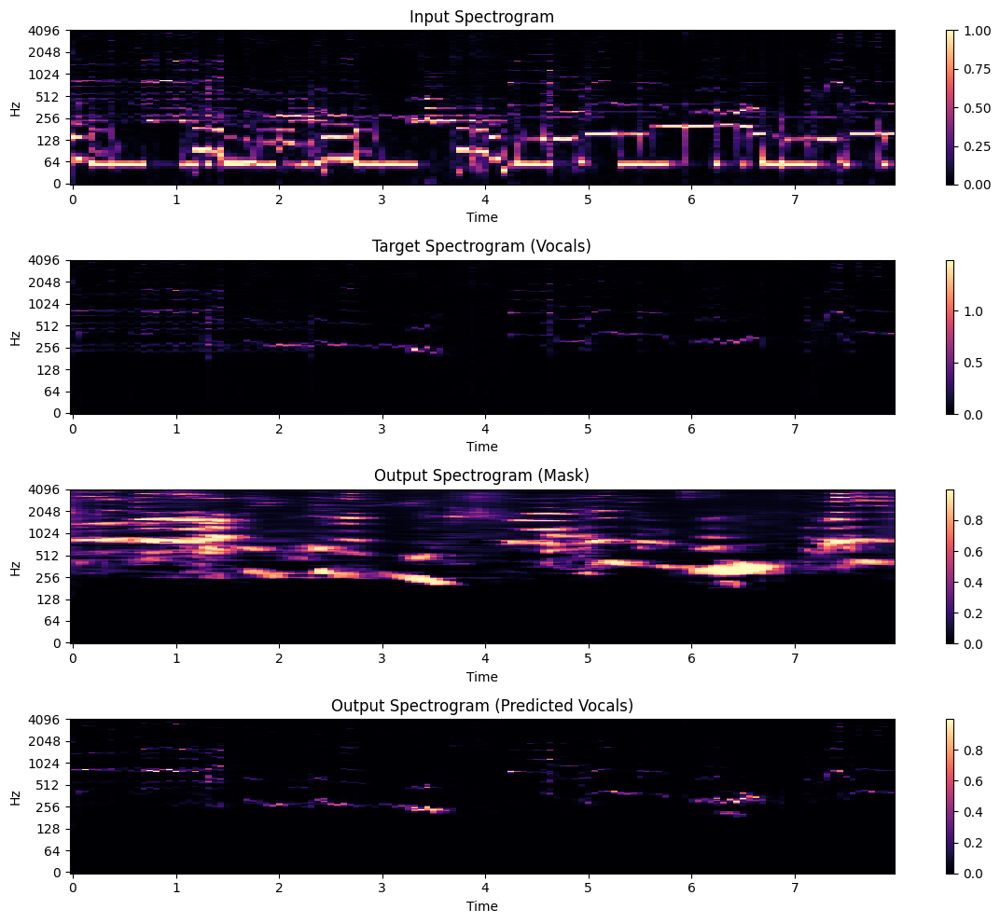

In [62]:
trained, target, mixed = test_result(unet, 470)

### Testing by Ear

#### Extracted Vocals From Model

In [63]:
Audio(trained, rate=8192)

#### Provided Isolated Vocals

In [64]:
Audio(target, rate=8192)

#### Original Mixed Signal

In [65]:
Audio(mixed, rate=8192)

### Using mir_eval for Evaluation of Model

Only computing the score for 10 clips since it takes super long to run for more than 10. The runtime scales quickly it seems.

In [163]:
from mir_eval.separation import bss_eval_sources

In [164]:
estimates = []
references = []
for idx in range(len(os.listdir('./segmented_data/test/mixtures'))):
    estimate, reference, _ = test_result(unet, idx, display=False)
    if (np.abs(np.sum(reference)) <= 0.00001):
        continue
    estimates.append(estimate)
    references.append(reference)

estimates = np.array(estimates)
references = np.array(references)

In [165]:
estimates.shape

(478, 97536)

In [168]:
sdrs, sirs, sars, perms = bss_eval_sources(estimates[:10], references[:10], compute_permutation=False)

In [170]:
np.mean(sdrs), np.mean(sirs), np.mean(sars)

(5.536707342937876, 17.80489770977243, 5.893367649607134)

### Testing Using a Song of Our Choice

In [80]:
def get_custom_clips(song_name, path, new_sr = 8192, segment_duration = 12):
    x, sr = librosa.load(path + "source/" + song_name, sr=new_sr)
    num_segments = int(len(x) / (segment_duration * sr))
        
    for i in range(num_segments):
        start_sample = i * segment_duration * sr
        end_sample = (i + 1) * segment_duration * sr
        mixture_segment = x[start_sample:end_sample]
        vocal_segment = x[start_sample:end_sample]
        mixture_output_path = os.path.join(path + "segmented", f"{song_name}_segment_{i}.wav")
        sf.write(mixture_output_path, mixture_segment, sr)

In [81]:
get_custom_clips("Fractures - Illenium.mp3", "custom_data/")

In [108]:
def split_song(model, song):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.eval()

    scaler = MinMaxScaler()
    song_scaled = scaler.fit_transform(np.abs(song))
    song_torch = torch.tensor(song_scaled).unsqueeze(0).unsqueeze(0).to(device)

    with torch.no_grad():  # Disable gradient computation
        mask = model(song_torch)

    mask_np = mask.cpu().numpy().squeeze()
    output = mask_np * song_scaled

    if (display):
        # Plot the spectrograms using librosa
        plt.figure(figsize=(12, 10))
    
        plt.subplot(3, 1, 1)
        plt.title('Input Spectrogram')
        librosa.display.specshow(song_scaled, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.subplot(3, 1, 2)
        plt.title('Output Spectrogram (Mask)')
        librosa.display.specshow(mask_np, sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.subplot(3, 1, 3)
        plt.title('Output Spectrogram (Predicted Vocals)')
        librosa.display.specshow(output , sr=8192, x_axis='time', y_axis='log', cmap="magma")
        plt.colorbar()
    
        plt.tight_layout()
        plt.show()

    iso_vocals = librosa.istft(song * mask_np, hop_length=768, win_length=1024, n_fft=1024)
    mixed_signal = librosa.istft(song, hop_length=768, win_length=1024, n_fft=1024)

    return iso_vocals, mixed_signal

In [109]:
def get_custom_spectrograms(sr=8192):
    mixtures = []
    song_names = os.listdir('custom_data/segmented')
    for song_name in song_names:
        m, _ = librosa.load('custom_data/segmented/' + song_name, sr = sr)
        M = librosa.stft(m, n_fft=1024, win_length = 1024, hop_length = 768)[:-1, :-1]
        mixtures.append(M)
    return np.array(mixtures)

In [110]:
custom_specs = get_custom_spectrograms()

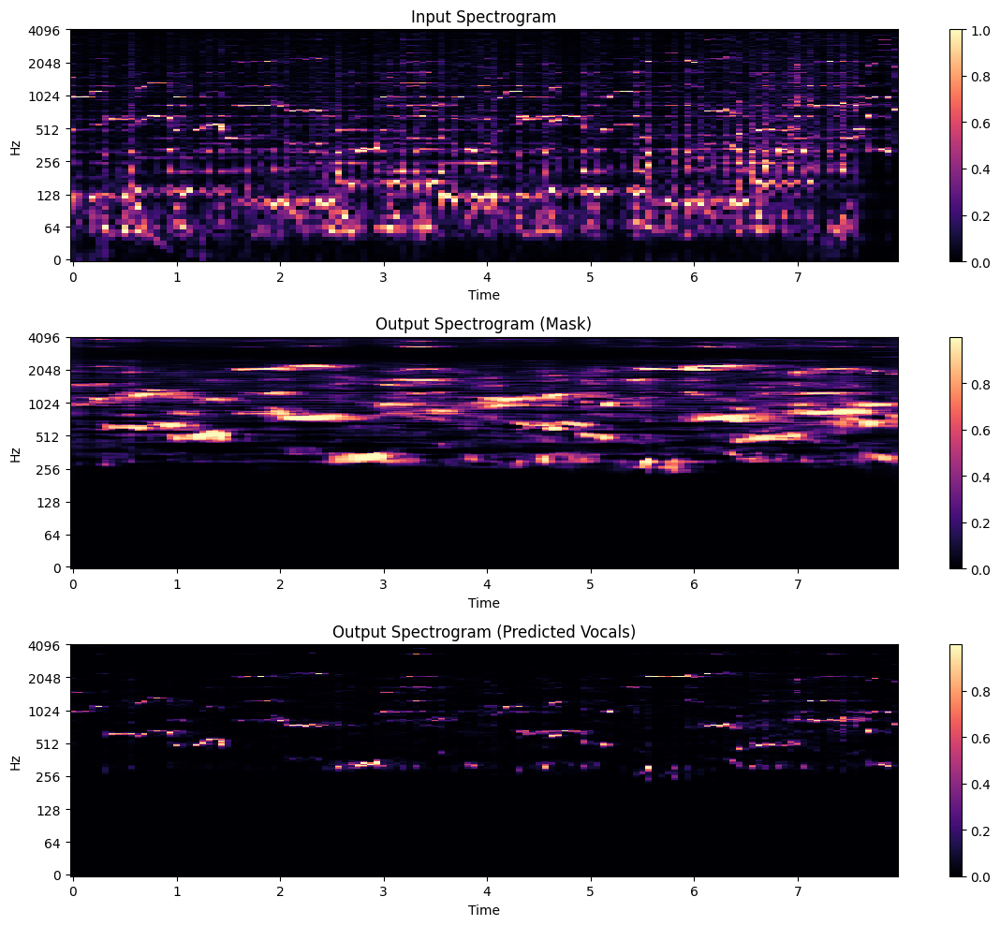

In [132]:
vocals, full_song = split_song(unet, custom_specs[8, :])

#### Extracted Vocals

In [133]:
Audio(vocals, rate=8192)

#### Full Song

In [134]:
Audio(full_song, rate=8192)